In [2]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os

In [3]:
#Sample 1 has a relatively high amount of fracture-filling carbonate mineralization occurring in the sample

# Folder path
folder_path = "/Users/anna/Desktop/XCT/SlicesCropped/1A-85-crop/"

# Filenames
image_files = ["1A-100-85kv.png", "1A-150-85kv.png","1A-200-85kv.png","1A-250-85kv.png","1A-300-85kv.png","1A-350-85kv.png","1A-400-85kv.png",
               "1A-450-85kv.png","1A-500-85kv.png","1A-550-85kv.png","1A-600-85kv.png","1A-650-85kv.png","1A-700-85kv.png","1A-750-85kv.png",
               "1A-800-85kv.png","1A-850-85kv.png","1A-900-85kv.png","1A-950-85kv.png","1A-1000-85kv.png","1A-1050-85kv.png","1A-1100-85kv.png"
               ,"1A-1150-85kv.png","1A-1200-85kv.png","1A-1250-85kv.png","1A-1300-85kv.png"]
#serpentine
#lower_threshold = 54
#upper_threshold = 55

#Carbonate
lower_threshold = 60
upper_threshold = 61

# Create a figure for the images and overlays
plt.figure(figsize=(12, 9 * len(image_files)))

# Loop through each image file
for i, image_file in enumerate(image_files):
    # Full path to the image
    image_path = os.path.join(folder_path, image_file)
    
    # Load the image and convert to grayscale
    ct_image = Image.open(image_path).convert("L")
    
    # Convert the image to a NumPy array
    ct_array = np.array(ct_image)
    
    # Create a mask for the segmented region
    segmented_mask = (ct_array >= lower_threshold) & (ct_array <= upper_threshold)
    
    # Create a color overlay with transparency
    overlay = np.zeros((*ct_array.shape, 3), dtype=np.uint8)  # Create an RGB image
    overlay[..., 0] = 255  # Red channel for the overlay
    overlay[~segmented_mask] = 0  # Set non-segmented areas to black
    
    # Combine original image and overlay using alpha blending
    alpha = 0.5  # Transparency level (0 = fully transparent, 1 = fully opaque)
    overlayed_image = np.dstack([ct_array] * 3)  # Convert grayscale to RGB
    overlayed_image = overlayed_image * (1 - alpha) + overlay * alpha
    
    # Plot the original, segmented, and overlayed images
    plt.subplot(len(image_files), 3, 3 * i + 1)
    plt.imshow(ct_array, cmap="gray")
    plt.title(f"Original CT Scan Image: {image_file}")
    plt.axis("off")
    
    plt.subplot(len(image_files), 3, 3 * i + 2)
    plt.imshow(segmented_mask, cmap="gray")
    plt.title(f"Segmented Mask ({lower_threshold}-{upper_threshold} Intensity)")
    plt.axis("off")
    
    plt.subplot(len(image_files), 3, 3 * i + 3)
    plt.imshow(overlayed_image.astype(np.uint8))
    plt.title(f"Overlayed Image")
    plt.axis("off")

plt.tight_layout()
#plt.savefig('1A-85-350-segmented(40-41).png')
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: '/Users/anna/Desktop/XCT/SlicesCropped/1A-85-crop/1A-100-85kv.png'

<Figure size 1200x22500 with 0 Axes>

In [87]:
# Folder path
folder_path = "/Users/anna/Desktop/XCT/SlicesCropped/1A-85-crop/"

# Filenames
image_files = ["1A-100-85kv.png", "1A-150-85kv.png", "1A-200-85kv.png", "1A-250-85kv.png", "1A-300-85kv.png", "1A-350-85kv.png", "1A-400-85kv.png",
               "1A-450-85kv.png", "1A-500-85kv.png", "1A-550-85kv.png", "1A-600-85kv.png", "1A-650-85kv.png", "1A-700-85kv.png", "1A-750-85kv.png",
               "1A-800-85kv.png", "1A-850-85kv.png", "1A-900-85kv.png", "1A-950-85kv.png", "1A-1000-85kv.png", "1A-1050-85kv.png", "1A-1100-85kv.png",
               "1A-1150-85kv.png", "1A-1200-85kv.png", "1A-1250-85kv.png", "1A-1300-85kv.png"]

# Intensity threshold
lower_threshold = 60
upper_threshold = 61

total_core_pixels = 0
total_core_segmented_pixels = 0

# Loop through each image file
for image_file in image_files:
    # Full path to the image
    image_path = os.path.join(folder_path, image_file)
    
    # Load the image and convert to grayscale
    ct_image = Image.open(image_path).convert("L")
    
    # Convert the image to a NumPy array
    ct_array = np.array(ct_image)
    
    # Create a mask for the segmented region
    segmented_mask = (ct_array >= lower_threshold) & (ct_array <= upper_threshold)
    
    # Calculate percentage
    total_pixels = ct_array.size
    segmented_pixels = np.sum(segmented_mask)
    percentage = (segmented_pixels / total_pixels) * 100
    
    print(f"Image: {image_file} - Percentage of pixels in range {lower_threshold}-{upper_threshold}: {percentage:.2f}%")
    
    # Accumulate totals for entire core
    total_core_pixels += total_pixels
    total_core_segmented_pixels += segmented_pixels

# Calculate overall percentage for the entire core
if total_core_pixels > 0:
    total_core_percentage = (total_core_segmented_pixels / total_core_pixels) * 100
    print(f"Total Core - Percentage of pixels in range {lower_threshold}-{upper_threshold}: {total_core_percentage:.2f}%")


Image: 1A-100-85kv.png - Percentage of pixels in range 60-61: 0.41%
Image: 1A-150-85kv.png - Percentage of pixels in range 60-61: 0.40%
Image: 1A-200-85kv.png - Percentage of pixels in range 60-61: 0.29%
Image: 1A-250-85kv.png - Percentage of pixels in range 60-61: 0.14%
Image: 1A-300-85kv.png - Percentage of pixels in range 60-61: 0.20%
Image: 1A-350-85kv.png - Percentage of pixels in range 60-61: 0.49%
Image: 1A-400-85kv.png - Percentage of pixels in range 60-61: 0.67%
Image: 1A-450-85kv.png - Percentage of pixels in range 60-61: 0.76%
Image: 1A-500-85kv.png - Percentage of pixels in range 60-61: 0.89%
Image: 1A-550-85kv.png - Percentage of pixels in range 60-61: 0.81%
Image: 1A-600-85kv.png - Percentage of pixels in range 60-61: 0.79%
Image: 1A-650-85kv.png - Percentage of pixels in range 60-61: 0.82%
Image: 1A-700-85kv.png - Percentage of pixels in range 60-61: 0.78%
Image: 1A-750-85kv.png - Percentage of pixels in range 60-61: 0.85%
Image: 1A-800-85kv.png - Percentage of pixels in

################################################################################ 135 ##############################################################################

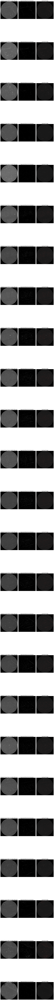

In [41]:
#Sample 1 has a relatively high amount of fracture-filling carbonate mineralization occurring in the sample

# Folder path
folder_path = "/Users/anna/Desktop/XCT/SlicesCropped/1A-135-crop/"

# Filenames
image_files = ["1A-100-135kv.png", "1A-150-135kv.png","1A-200-135kv.png","1A-250-135kv.png","1A-300-135kv.png","1A-350-135kv.png","1A-400-135kv.png",
               "1A-450-135kv.png","1A-500-135kv.png","1A-550-135kv.png","1A-600-135kv.png","1A-650-135kv.png","1A-700-135kv.png","1A-750-135kv.png",
               "1A-800-135kv.png","1A-850-135kv.png","1A-900-135kv.png","1A-950-135kv.png","1A-1000-135kv.png","1A-1050-135kv.png","1A-1100-135kv.png"
               ,"1A-1150-135kv.png","1A-1200-135kv.png","1A-1250-135kv.png","1A-1300-135kv.png"]
#serpentine
#lower_threshold = 54
#upper_threshold = 55

#Carbonate
lower_threshold = 61
upper_threshold = 62

# Create a figure for the images and overlays
plt.figure(figsize=(12, 9 * len(image_files)))

# Loop through each image file
for i, image_file in enumerate(image_files):
    # Full path to the image
    image_path = os.path.join(folder_path, image_file)
    
    # Load the image and convert to grayscale
    ct_image = Image.open(image_path).convert("L")
    
    # Convert the image to a NumPy array
    ct_array = np.array(ct_image)
    
    # Create a mask for the segmented region
    segmented_mask = (ct_array >= lower_threshold) & (ct_array <= upper_threshold)
    
    # Create a color overlay with transparency
    overlay = np.zeros((*ct_array.shape, 3), dtype=np.uint8)  # Create an RGB image
    overlay[..., 0] = 255  # Red channel for the overlay
    overlay[~segmented_mask] = 0  # Set non-segmented areas to black
    
    # Combine original image and overlay using alpha blending
    alpha = 0.5  # Transparency level (0 = fully transparent, 1 = fully opaque)
    overlayed_image = np.dstack([ct_array] * 3)  # Convert grayscale to RGB
    overlayed_image = overlayed_image * (1 - alpha) + overlay * alpha
    
    # Plot the original, segmented, and overlayed images
    plt.subplot(len(image_files), 3, 3 * i + 1)
    plt.imshow(ct_array, cmap="gray")
    plt.title(f"Original CT Scan Image: {image_file}")
    plt.axis("off")
    
    plt.subplot(len(image_files), 3, 3 * i + 2)
    plt.imshow(segmented_mask, cmap="gray")
    plt.title(f"Segmented Mask ({lower_threshold}-{upper_threshold} Intensity)")
    plt.axis("off")
    
    plt.subplot(len(image_files), 3, 3 * i + 3)
    plt.imshow(overlayed_image.astype(np.uint8))
    plt.title(f"Overlayed Image")
    plt.axis("off")

plt.tight_layout()
#plt.savefig('1A-85-350-segmented(40-41).png')
plt.show()

In [84]:
# Folder path
folder_path = "/Users/anna/Desktop/XCT/SlicesCropped/1A-135-crop/"

# Filenames
image_files = ["1A-100-135kv.png", "1A-150-135kv.png","1A-200-135kv.png","1A-250-135kv.png","1A-300-135kv.png","1A-350-135kv.png","1A-400-135kv.png",
               "1A-450-135kv.png","1A-500-135kv.png","1A-550-135kv.png","1A-600-135kv.png","1A-650-135kv.png","1A-700-135kv.png","1A-750-135kv.png",
               "1A-800-135kv.png","1A-850-135kv.png","1A-900-135kv.png","1A-950-135kv.png","1A-1000-135kv.png","1A-1050-135kv.png","1A-1100-135kv.png"
               ,"1A-1150-135kv.png","1A-1200-135kv.png","1A-1250-135kv.png","1A-1300-135kv.png"]

# Intensity threshold
lower_threshold = 61
upper_threshold = 62

total_core_pixels = 0
total_core_segmented_pixels = 0

# Loop through each image file
for image_file in image_files:
    # Full path to the image
    image_path = os.path.join(folder_path, image_file)
    
    # Load the image and convert to grayscale
    ct_image = Image.open(image_path).convert("L")
    
    # Convert the image to a NumPy array
    ct_array = np.array(ct_image)
    
    # Create a mask for the segmented region
    segmented_mask = (ct_array >= lower_threshold) & (ct_array <= upper_threshold)
    
    # Calculate percentage
    total_pixels = ct_array.size
    segmented_pixels = np.sum(segmented_mask)
    percentage = (segmented_pixels / total_pixels) * 100
    
    print(f"Image: {image_file} - Percentage of pixels in range {lower_threshold}-{upper_threshold}: {percentage:.2f}%")
    
    # Accumulate totals for entire core
    total_core_pixels += total_pixels
    total_core_segmented_pixels += segmented_pixels

# Calculate overall percentage for the entire core
if total_core_pixels > 0:
    total_core_percentage = (total_core_segmented_pixels / total_core_pixels) * 100
    print(f"Total Core - Percentage of pixels in range {lower_threshold}-{upper_threshold}: {total_core_percentage:.2f}%")


Image: 1A-100-135kv.png - Percentage of pixels in range 61-62: 0.38%
Image: 1A-150-135kv.png - Percentage of pixels in range 61-62: 0.38%
Image: 1A-200-135kv.png - Percentage of pixels in range 61-62: 0.21%
Image: 1A-250-135kv.png - Percentage of pixels in range 61-62: 0.12%
Image: 1A-300-135kv.png - Percentage of pixels in range 61-62: 0.15%
Image: 1A-350-135kv.png - Percentage of pixels in range 61-62: 0.55%
Image: 1A-400-135kv.png - Percentage of pixels in range 61-62: 0.81%
Image: 1A-450-135kv.png - Percentage of pixels in range 61-62: 0.88%
Image: 1A-500-135kv.png - Percentage of pixels in range 61-62: 1.05%
Image: 1A-550-135kv.png - Percentage of pixels in range 61-62: 0.98%
Image: 1A-600-135kv.png - Percentage of pixels in range 61-62: 0.98%
Image: 1A-650-135kv.png - Percentage of pixels in range 61-62: 1.00%
Image: 1A-700-135kv.png - Percentage of pixels in range 61-62: 0.98%
Image: 1A-750-135kv.png - Percentage of pixels in range 61-62: 0.95%
Image: 1A-800-135kv.png - Percenta

############################################# 220 #################################################################

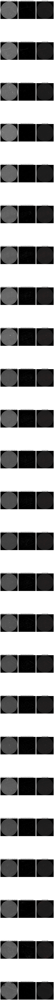

In [77]:
#Sample 1 has a relatively high amount of fracture-filling carbonate mineralization occurring in the sample

# Folder path
folder_path = "/Users/anna/Desktop/XCT/SlicesCropped/1A-220-crop/"

# Filenames
image_files = ["1A-100-220kv.png", "1A-150-220kv.png","1A-200-220kv.png","1A-250-220kv.png","1A-300-220kv.png","1A-350-220kv.png","1A-400-220kv.png",
               "1A-450-220kv.png","1A-500-220kv.png","1A-550-220kv.png","1A-600-220kv.png","1A-650-220kv.png","1A-700-220kv.png","1A-750-220kv.png",
               "1A-800-220kv.png","1A-850-220kv.png","1A-900-220kv.png","1A-950-220kv.png","1A-1000-220kv.png","1A-1050-220kv.png","1A-1100-220kv.png"
               ,"1A-1150-220kv.png","1A-1200-220kv.png","1A-1250-220kv.png","1A-1300-220kv.png"]
#Matrix
#lower_threshold = 54
#upper_threshold = 55

#Serpentine
#lower_threshold = 61
#upper_threshold = 62

lower_threshold = 68
upper_threshold = 69

# Create a figure for the images and overlays
plt.figure(figsize=(12, 9 * len(image_files)))

# Loop through each image file
for i, image_file in enumerate(image_files):
    # Full path to the image
    image_path = os.path.join(folder_path, image_file)
    
    # Load the image and convert to grayscale
    ct_image = Image.open(image_path).convert("L")
    
    # Convert the image to a NumPy array
    ct_array = np.array(ct_image)
    
    # Create a mask for the segmented region
    segmented_mask = (ct_array >= lower_threshold) & (ct_array <= upper_threshold)
    
    # Create a color overlay with transparency
    overlay = np.zeros((*ct_array.shape, 3), dtype=np.uint8)  # Create an RGB image
    overlay[..., 0] = 255  # Red channel for the overlay
    overlay[~segmented_mask] = 0  # Set non-segmented areas to black
    
    # Combine original image and overlay using alpha blending
    alpha = 0.5  # Transparency level (0 = fully transparent, 1 = fully opaque)
    overlayed_image = np.dstack([ct_array] * 3)  # Convert grayscale to RGB
    overlayed_image = overlayed_image * (1 - alpha) + overlay * alpha
    
    # Plot the original, segmented, and overlayed images
    plt.subplot(len(image_files), 3, 3 * i + 1)
    plt.imshow(ct_array, cmap="gray")
    plt.title(f"Original CT Scan Image: {image_file}")
    plt.axis("off")
    
    plt.subplot(len(image_files), 3, 3 * i + 2)
    plt.imshow(segmented_mask, cmap="gray")
    plt.title(f"Segmented Mask ({lower_threshold}-{upper_threshold} Intensity)")
    plt.axis("off")
    
    plt.subplot(len(image_files), 3, 3 * i + 3)
    plt.imshow(overlayed_image.astype(np.uint8))
    plt.title(f"Overlayed Image")
    plt.axis("off")

plt.tight_layout()
#plt.savefig('1A-85-350-segmented(40-41).png')
plt.show()

In [6]:
# Folder path
folder_path = "/Users/anna/Desktop/X-RayCT/SlicesCropped/1A-220-crop/"

# Filenames
image_files = ["1A-100-220kv.png", "1A-150-220kv.png","1A-200-220kv.png","1A-250-220kv.png","1A-300-220kv.png","1A-350-220kv.png","1A-400-220kv.png",
               "1A-450-220kv.png","1A-500-220kv.png","1A-550-220kv.png","1A-600-220kv.png","1A-650-220kv.png","1A-700-220kv.png","1A-750-220kv.png",
               "1A-800-220kv.png","1A-850-220kv.png","1A-900-220kv.png","1A-950-220kv.png","1A-1000-220kv.png","1A-1050-220kv.png","1A-1100-220kv.png"
               ,"1A-1150-220kv.png","1A-1200-220kv.png","1A-1250-220kv.png","1A-1300-220kv.png"]

# Intensity threshold
lower_threshold = 68
upper_threshold = 69

total_core_pixels = 0
total_core_segmented_pixels = 0

# Loop through each image file
for image_file in image_files:
    # Full path to the image
    image_path = os.path.join(folder_path, image_file)
    
    # Load the image and convert to grayscale
    ct_image = Image.open(image_path).convert("L")
    
    # Convert the image to a NumPy array
    ct_array = np.array(ct_image)
    
    # Create a mask for the segmented region
    segmented_mask = (ct_array >= lower_threshold) & (ct_array <= upper_threshold)
    
    # Calculate percentage
    total_pixels = ct_array.size
    segmented_pixels = np.sum(segmented_mask)
    percentage = (segmented_pixels / total_pixels) * 100
    
    print(f"Image: {image_file} - Percentage of pixels in range {lower_threshold}-{upper_threshold}: {percentage:.2f}%")
    
    # Accumulate totals for entire core
    total_core_pixels += total_pixels
    total_core_segmented_pixels += segmented_pixels

# Calculate overall percentage for the entire core
if total_core_pixels > 0:
    total_core_percentage = (total_core_segmented_pixels / total_core_pixels) * 100
    print(f"Total Core - Percentage of pixels in range {lower_threshold}-{upper_threshold}: {total_core_percentage:.2f}%")
    
    #38-36

Image: 1A-100-220kv.png - Percentage of pixels in range 68-69: 0.36%
Image: 1A-150-220kv.png - Percentage of pixels in range 68-69: 0.37%
Image: 1A-200-220kv.png - Percentage of pixels in range 68-69: 0.20%
Image: 1A-250-220kv.png - Percentage of pixels in range 68-69: 0.13%
Image: 1A-300-220kv.png - Percentage of pixels in range 68-69: 0.18%
Image: 1A-350-220kv.png - Percentage of pixels in range 68-69: 0.58%
Image: 1A-400-220kv.png - Percentage of pixels in range 68-69: 0.90%
Image: 1A-450-220kv.png - Percentage of pixels in range 68-69: 0.94%
Image: 1A-500-220kv.png - Percentage of pixels in range 68-69: 1.09%
Image: 1A-550-220kv.png - Percentage of pixels in range 68-69: 1.12%
Image: 1A-600-220kv.png - Percentage of pixels in range 68-69: 1.08%
Image: 1A-650-220kv.png - Percentage of pixels in range 68-69: 1.02%
Image: 1A-700-220kv.png - Percentage of pixels in range 68-69: 1.01%
Image: 1A-750-220kv.png - Percentage of pixels in range 68-69: 1.00%
Image: 1A-800-220kv.png - Percenta

In [5]:
# Folder path
folder_path = "/Users/anna/Desktop/X-RayCT/SlicesCropped/1A-220-crop/"

# Filenames
image_files = ["1A-100-220kv.png", "1A-150-220kv.png","1A-200-220kv.png","1A-250-220kv.png","1A-300-220kv.png","1A-350-220kv.png","1A-400-220kv.png",
               "1A-450-220kv.png","1A-500-220kv.png","1A-550-220kv.png","1A-600-220kv.png","1A-650-220kv.png","1A-700-220kv.png","1A-750-220kv.png",
               "1A-800-220kv.png","1A-850-220kv.png","1A-900-220kv.png","1A-950-220kv.png","1A-1000-220kv.png","1A-1050-220kv.png","1A-1100-220kv.png"
               ,"1A-1150-220kv.png","1A-1200-220kv.png","1A-1250-220kv.png","1A-1300-220kv.png"]

# Intensity threshold
lower_threshold = 68
upper_threshold = 69

total_core_pixels = 0
total_core_segmented_pixels = 0

# Loop through each image file
for image_file in image_files:
    # Full path to the image
    image_path = os.path.join(folder_path, image_file)
    
    # Load the image and convert to grayscale
    ct_image = Image.open(image_path).convert("L")
    
    # Convert the image to a NumPy array
    ct_array = np.array(ct_image)
    
    # Mask to exclude black pixels
    valid_pixels_mask = ct_array > 0

    # Mask for the segmented region within valid pixels
    segmented_mask = (ct_array >= lower_threshold) & (ct_array <= upper_threshold) & valid_pixels_mask

    # Count pixels
    total_valid_pixels = np.sum(valid_pixels_mask)
    segmented_pixels = np.sum(segmented_mask)
    
    # Calculate percentage
    percentage = (segmented_pixels / total_valid_pixels) * 100 if total_valid_pixels > 0 else 0
    
    print(f"Image: {image_file} - % in range {lower_threshold}-{upper_threshold} (excluding black): {percentage:.2f}%")
    
    # Accumulate totals for entire core
    total_core_pixels += total_valid_pixels
    total_core_segmented_pixels += segmented_pixels

# Calculate overall percentage for the entire core
if total_core_pixels > 0:
    total_core_percentage = (total_core_segmented_pixels / total_core_pixels) * 100
    print(f"\nTotal Core - % of pixels in range {lower_threshold}-{upper_threshold} (excluding black): {total_core_percentage:.2f}%")

Image: 1A-100-220kv.png - % in range 68-69 (excluding black): 0.46%
Image: 1A-150-220kv.png - % in range 68-69 (excluding black): 0.47%
Image: 1A-200-220kv.png - % in range 68-69 (excluding black): 0.25%
Image: 1A-250-220kv.png - % in range 68-69 (excluding black): 0.16%
Image: 1A-300-220kv.png - % in range 68-69 (excluding black): 0.23%
Image: 1A-350-220kv.png - % in range 68-69 (excluding black): 0.74%
Image: 1A-400-220kv.png - % in range 68-69 (excluding black): 1.14%
Image: 1A-450-220kv.png - % in range 68-69 (excluding black): 1.20%
Image: 1A-500-220kv.png - % in range 68-69 (excluding black): 1.39%
Image: 1A-550-220kv.png - % in range 68-69 (excluding black): 1.42%
Image: 1A-600-220kv.png - % in range 68-69 (excluding black): 1.37%
Image: 1A-650-220kv.png - % in range 68-69 (excluding black): 1.29%
Image: 1A-700-220kv.png - % in range 68-69 (excluding black): 1.28%
Image: 1A-750-220kv.png - % in range 68-69 (excluding black): 1.27%
Image: 1A-800-220kv.png - % in range 68-69 (excl